# Simple test notebook besca signature and annotation functions

This notebook can be used to test a besca version to ensure that everything is still functional.

In [12]:
import warnings
warnings.filterwarnings("ignore", message="numpy.dtype size changed")

In [13]:
import scanpy.api as sc
import besca as bc
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

In [28]:
setName = 'HumanCD45p_scseqCMs6'

# Computing scores by hand and automated annotation of the immune compartments.

In [29]:
analysis_name='FBGE_2.7_mod'
results_folder='/pstore/data//biomics/_pre_portfolio/ONC/scSEQ/ROCHE_INHOUSE/Schlieren_Project_Support_21/FB/analyzed/'+analysis_name+'/'
adata=sc.read(results_folder+analysis_name+'.h5ad')
f= pd.read_csv(results_folder + "/labelings/louvain/fract_pos.gct",sep="\t",skiprows=2)

In [30]:
from requests import post
BASE_URL = 'http://bioinfo.bas.roche.com:1234/api/genesets'
dataIn = {
    'setName': setName, 
    'returnParams': ['setName','genes']
}
returnJSON = post(BASE_URL, json=dataIn).json()
annotSigns={}
for i in range(0,len(returnJSON['response'])):
	annotSigns[returnJSON['response'][i]['setName']]=[x[0][0] for x in returnJSON['response'][i]['genes']]


In [31]:
returnJSON

{'response': [{'genes': [[['FCRL4', '83417', 'FCRL4', '83417'], None],
    [['FCRL5', '83416', 'FCRL5', '83416'], None],
    [['CCR7', '1236', 'CCR7', '1236'], None],
    [['CD40', '958', 'CD40', '958'], None],
    [['ZBTB32', '27033', 'ZBTB32', '27033'], None],
    [['BATF', '10538', 'BATF', '10538'], None]],
   'setName': 'HumanCD45p_scseqCMs6_ActB'},
  {'genes': [[['CD69', '969', 'CD69', '969'], None],
    [['CCL5', '6352', 'CCL5', '6352'], None],
    [['TNFRSF9', '3604', 'TNFRSF9', '3604'], None],
    [['TNFRSF4', '7293', 'TNFRSF4', '7293'], None],
    [['FCGR3', '', 'FCGR3', ''], None]],
   'setName': 'HumanCD45p_scseqCMs6_Activation'},
  {'genes': [[['ANPEP', '290', 'ANPEP', '290'], None],
    [['CCR3', '1232', 'CCR3', '1232'], None],
    [['CD44', '960', 'CD44', '960'], None],
    [['CD63', '967', 'CD63', '967'], None],
    [['CD69', '969', 'CD69', '969'], None],
    [['ENPP3', '5169', 'ENPP3', '5169'], None],
    [['ICAM1', '3383', 'ICAM1', '3383'], None],
    [['IL3RA', '3563'

In [32]:
mymarkers={}
for key, value in annotSigns.items():
    mym=[]
    for item in value:
        if (sum(adata.raw.var.index.isin([item])*1)>0):
            mym.append(item)
    if (len(mym)>0): mymarkers[key]=mym

In [33]:
mymarkers

{'HumanCD45p_scseqCMs6_ActB': ['FCRL5', 'CCR7', 'CD40', 'ZBTB32', 'BATF'],
 'HumanCD45p_scseqCMs6_Activation': ['CD69', 'CCL5', 'TNFRSF9', 'TNFRSF4'],
 'HumanCD45p_scseqCMs6_Basophil': ['ANPEP',
  'CCR3',
  'CD44',
  'CD63',
  'CD69',
  'ICAM1',
  'IL3RA',
  'LAMP1',
  'TLR4'],
 'HumanCD45p_scseqCMs6_Bcells': ['CD19', 'MS4A1', 'CD79A', 'CD79B'],
 'HumanCD45p_scseqCMs6_CCG1S': ['ATAD2',
  'BLM',
  'BRIP1',
  'CASP8AP2',
  'CCNE2',
  'CDCA7',
  'CHAF1B',
  'CLSPN',
  'FEN1',
  'GINS2',
  'GMNN',
  'HELLS',
  'MCM2',
  'MCM4',
  'MCM5',
  'PCNA',
  'POLA1',
  'UNG'],
 'HumanCD45p_scseqCMs6_CCG2M': ['AURKA',
  'AURKB',
  'BIRC5',
  'CENPE',
  'CENPF',
  'KIF11',
  'KIF23',
  'MKI67',
  'SMC4',
  'TOP2A',
  'TUBB4B'],
 'HumanCD45p_scseqCMs6_Cafs': ['COL6A2', 'COL6A3', 'CD248', 'MXRA8'],
 'HumanCD45p_scseqCMs6_Cellcycle': ['MKI67', 'PCNA', 'STMN1', 'HMGB2'],
 'HumanCD45p_scseqCMs6_Checkpoint': ['TIGIT',
  'CD274',
  'LAG3',
  'PDCD1',
  'TNFRSF4',
  'HAVCR2'],
 'HumanCD45p_scseqCMs6_Cyto': [

In [34]:
df=bc.tl.sig.score_mw(f,mymarkers)

In [35]:
df.head()

,0,8,9,13,14,11,12,1,2,15,3,6,7,4,16,10,5
HumanCD45p_scseqCMs6_ActB,0.845541,3.1215,3.48537,0.326395,2.22195,14.53,5.95232,2.14977,0.919971,0.862394,2.30202,0.87626,2.92863,0.202951,0.199316,1.61002,42.436
HumanCD45p_scseqCMs6_Activation,13.7909,20.7514,19.2989,1.37901,40.3238,34.7197,17.2798,6.24549,31.9578,3.0091,26.6361,11.6828,4.10603,2.40334,1.73056,15.531,4.90938
HumanCD45p_scseqCMs6_Basophil,5.04182,5.62698,3.46643,34.4806,16.6325,11.7494,8.48317,4.72326,6.40495,22.4328,8.10639,4.48323,4.95676,40.3461,23.9916,8.27423,8.91556
HumanCD45p_scseqCMs6_Bcells,1.33089,2.86819,1.74514,2.56832,2.71507,5.50824,1.91032,2.20776,1.28376,2.23204,2.71801,0.81641,4.18692,0.502313,2.91339,1.33191,75.6912
HumanCD45p_scseqCMs6_CCG1S,0.508619,0.262161,0.960339,0.0202768,0.269717,2.03681,0.153942,0.0792933,0.374086,0.0427593,0.398097,0.255582,0.100797,0.00355167,0.153245,0.0999182,0.866092


In [36]:

myc=np.median(df.loc[setName+'_Ubi',:]*2/3)
cNames=bc.tl.sig.make_anno(df,myc,setName,f)

In [37]:
adata=bc.tl.sig.add_anno(adata,cNames)

... storing 'cell_names' as categorical
... storing 'cell_group' as categorical
... storing 'scell_group' as categorical
... storing 'sscell_group' as categorical


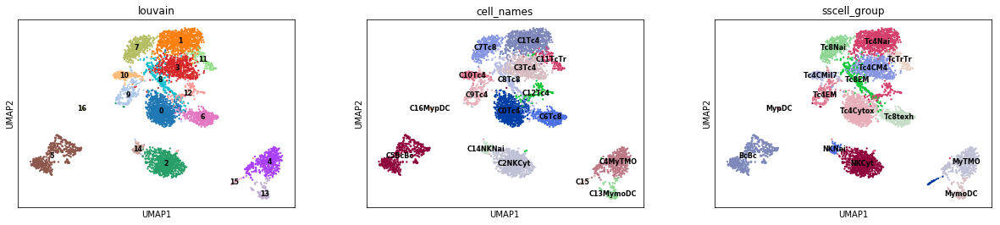

In [38]:
sc.pl.umap(adata, color=['louvain','cell_names','sscell_group'], legend_loc='on data',legend_fontsize=8)

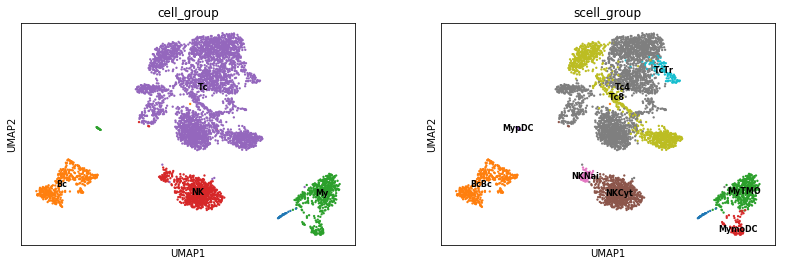

In [39]:
sc.pl.umap(adata, color=['cell_group','scell_group'], legend_loc='on data',legend_fontsize=8)

## Using custom palette colors


In [40]:
paletteDict = {'Tc': '#9af9f2',
             'My': '#ffa8e7',
             'Bc': '#9891ff',
             'NK': '#fea7a7',
              '': '#70f1be'
             }

all(elem in paletteDict.keys()  for elem in   set(adata.obs.get('cell_group'))  )
bc.pl.update_qualitative_palette( adata, paletteDict, group ='cell_group')


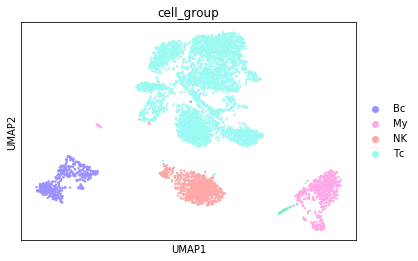

In [41]:
sc.pl.umap(adata, color=['cell_group'])

# Using Automated scoring function

In [42]:
from requests import post

BASE_URL = 'http://bioinfo.bas.roche.com:1234/api/genesets'
dataIn = {
    'setName': setName,
    'returnParams': ['setName','genes']
}

In [43]:
# THIS COMMAND COMPUTE AUTOMATICALLY THE SCANPY SCORE FOR ALL SIGNATURE STARTING WITH PREFIX HUmanCD45P_scseqCMs5.
bc.tl.sig.combined_signature_score(adata=adata, GEMS_command=dataIn, use_raw=True, verbose = False)

/pstore/home/julienla/.local/lib/python3.6/site-packages/scanpy/tools/_score_genes.py:115: RuntimeWarning:

Mean of empty slice



/pstore/home/julienla/.local/lib/python3.6/site-packages/anndata/core/anndata.py:299: FutureWarning:

In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.



In [44]:
# Getting the columns containing the signature scores
combined_cols =  [col for col in adata.obs.columns if setName in col]
#combined_cols

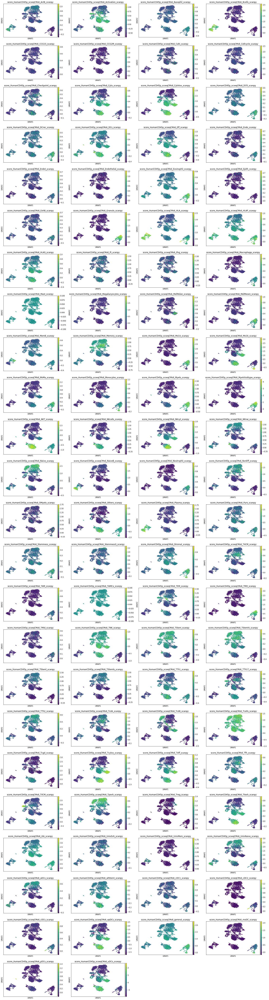

(None,)

In [45]:

sc.pl.umap(adata, color=combined_cols,
           color_map='viridis', projection='2d',
           title=combined_cols ) ,
           #save="." + analysis_name + '.Markers.png')



# Additional feature of the sig module


The main advantage of the signature computation implementation is the possibility to use *combined* signature composed of a UP and DN part. The total score is then computed using 
$$UP - DN $$

Here we did not find an optimal geneset to display such capacities. However, we focus on the case where one would like to see if there are gene sets specific to discriminating CD4 Naive T cells.
 Using GEMS one can query geneset using regular expression.
 We do not focus on single-cell defined signatures


In [46]:
dd = { 
    #'setName': 'GOLDRATH_EFF|GOLDRATH_NAIVE|KAECH_|GSE11057', # THIS WOULD BE A OR MATCHING
    'setName': 'NAIVE_VS.*CD4|CD4*NAIVE', # 
    'returnParams': ['setName','desc', 'genes']
    }

In [47]:
#All scores are automatically computed
# A warning is raised by score_gene in scanpy when a gene is not found. This is removed when verbose = FALSE
bc.tl.sig.combined_signature_score(adata=adata, GEMS_command=dd, use_raw=True, verbose=False)

/pstore/home/julienla/.local/lib/python3.6/site-packages/scanpy/tools/_score_genes.py:115: RuntimeWarning:

Mean of empty slice



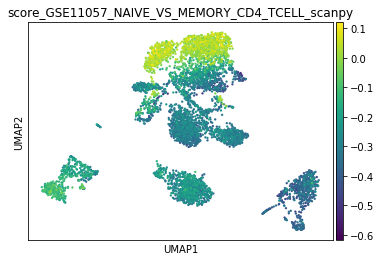

In [48]:
# Visualising some signature
cols_chosen=[col for col in adata.obs.columns if 'NAIVE_VS_MEMORY_CD4'  in col]

#Carefull the scale is not strong here, It is just an example showing that naives marker can be found in the nai annotated clusters
sc.pl.umap(adata, color= cols_chosen,
      color_map='viridis', projection='2d'
            )

In [49]:
## Verifying signatures genes?

In [50]:
# Getting the signatures are as a dict of dict
signDict = bc.tl.sig.get_GEMS_sign(dd)

#Signature can be composed of a UP and a DN signature due to the comparison. Score is automatically computed on the combination.
signDict['GSE11057_NAIVE_VS_CENT_MEMORY_CD4_TCELL'].keys()

dict_keys(['DN', 'UP'])

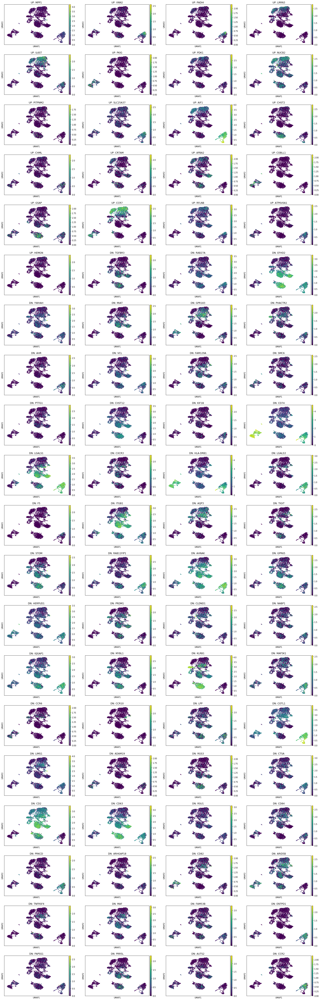

In [51]:
gg =  signDict['GSE11057_NAIVE_VS_CENT_MEMORY_CD4_TCELL']['UP']
genes_up_in = [x for x in gg if x in adata.var_names]
gg =  signDict['GSE11057_NAIVE_VS_CENT_MEMORY_CD4_TCELL']['DN']
genes_dn_in = [x for x in gg if x in adata.var_names]


sc.pl.umap(adata, color = genes_up_in +  genes_dn_in,
           color_map= 'viridis', projection = '2d', 
           use_raw = True, 
           title =  ['UP: ' + x for x in genes_up_in]+  ['DN: ' + x for x in genes_dn_in]
          )